# Annotating Cell Types

This workbook can be run after the standard workflow.
It is demonstrating how to use the  annotation function to annotate the dataset that was runned through the standard worflow.

In this notebook, we will show how to use in-besca annotation to assign cell type to clusters.
We focus on immune celltype and demonstrate signature-scoring functions.


An alternative in the case a an annotated training dataset already exists is to use the auto-annot module. Please refer to the corresponding tutorial.

In [ ]:
import besca as bc
import numpy as np
import pandas as pd
import scanpy.api as sc
import matplotlib.pyplot as plt
from scipy import sparse, io
import os
import time
import logging
import seaborn as sns
sc.logging.print_versions()

# for standard processing, set verbosity to minimum
sc.settings.verbosity = 0  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80)
version = '2.8'
start0 = time.time()

In [2]:
#define standardized filepaths based on above input
root_path = os.getcwd()
bescapath='./'

analysis_name = 'standard_workflow_besca2_0'
results_folder = os.path.join(root_path, 'analyzed', analysis_name)
results_file = os.path.join(results_folder, analysis_name + '.annotated.h5ad')
clusters='leiden'

In [3]:

adata = sc.read_h5ad(os.path.join(results_folder, analysis_name + '.h5ad') )
adata


AnnData object with n_obs × n_vars = 8569 × 1839 
    obs: 'Individual', 'assigned_cluster', 'barcode', 'percent_mito', 'n_counts', 'n_genes', 'leiden'
    var: 'ENSEMBL', 'SYMBOL', 'n_cells', 'total_counts', 'frac_reads'
    uns: 'Individual_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

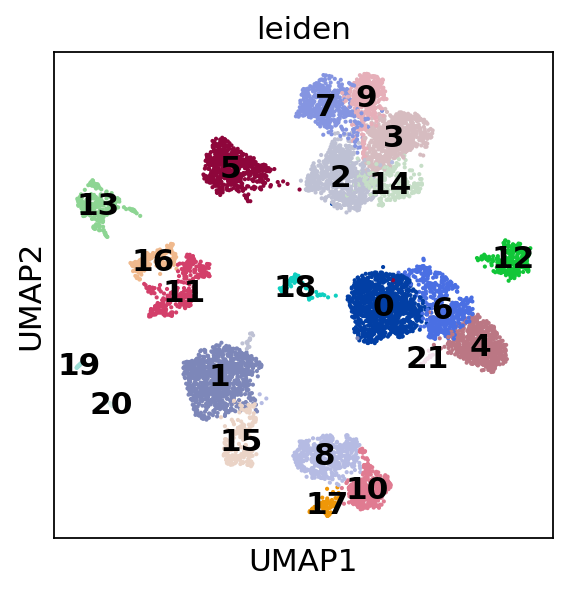

In [4]:
sc.pl.umap(adata, color= [clusters], legend_loc='on data')

### Inspect available public annotation


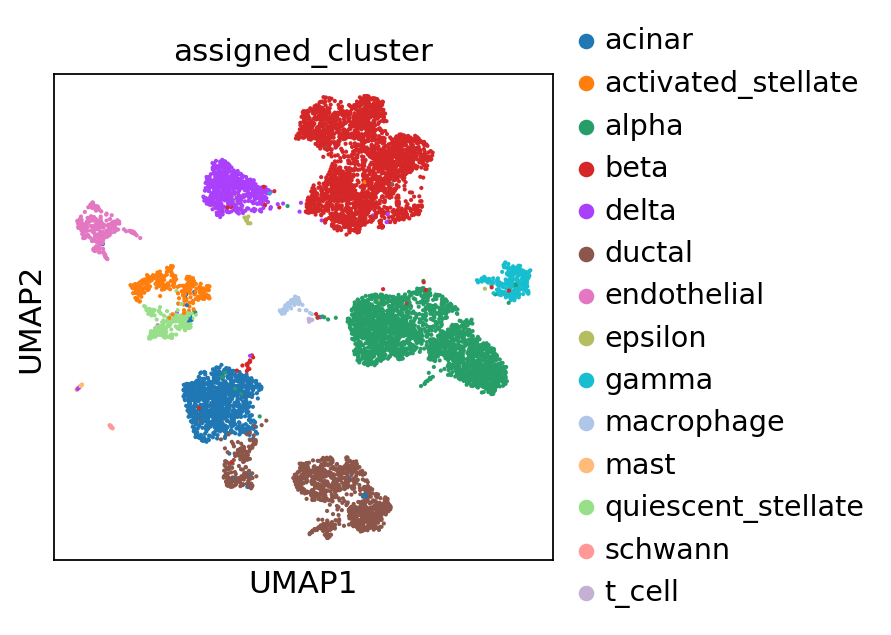

In [5]:
sc.pl.umap(adata, color= ['assigned_cluster'])


#### If one trusts this annotation, one can obtain top markers per annotation & use to refine the signatures

In [149]:
### Perform DE cells of each Cell_type vs. all other cells
DEgenes=bc.tl.dge.get_de(adata,'assigned_cluster',demethod='wilcoxon',topnr=5000, logfc=1,padj=0.05)


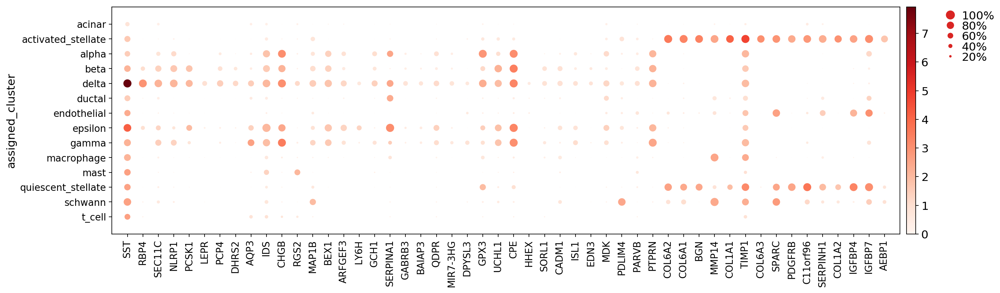

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[17.5, 0, 0.2, 0.5, 0.25])

In [150]:
### Select only top genes (in order of p-val) for 2 cell types and plot expression per cell type
tops=list(DEgenes['delta']['Name'][0:35])+list(DEgenes['activated_stellate']['Name'][0:15])
sc.pl.dotplot(adata, var_names=tops,groupby='assigned_cluster')


### Inspect various signatures

In [8]:
# One can load besca-provided signatures using the function below
signature_dict = bc.datasets.load_immune_signatures(refined=False)

signature_dict

{'lymphocyte': ['PTPRC'],
 'myeloid': ['S100A8', 'S100A9', 'CST3'],
 'Bcell': ['CD19', 'CD79A', 'MS4A1'],
 'Tcells': ['CD3E', 'CD3G', 'CD3D'],
 'CD4': ['CD4'],
 'CD8': ['CD8A', 'CD8B'],
 'NKcell': ['NKG7', 'GNLY', 'NCAM1'],
 'monocyte': ['CST3', 'CSF1R', 'ITGAM', 'CD14', 'FCGR3A', 'FCGR3B'],
 'macrophage': ['CD14',
  'IL1B',
  'LYZ    CD163   ITGAX',
  'CD68',
  'CSF1R',
  'FCGR3A']}

Additionaly it is possible to read an compute scanpy score using this function below.

If the gmt file is composed of combined signature (UP and DN), a common score will be computed: 
$$Total\_SCORE= Score_{UP} - Score_{DN}$$

# Signatures for specific sub-populations

In [128]:
 ## PROVIDED WITH BESCA, make a local copy if you'd like to modify/add your own
gmt_file_anno= bescapath + '/besca/datasets/genesets/CellNames_scseqCMs6_sigs.gmt'
#gmt_file_anno= root_path + '/analyzed/'+analysis_name+ 'CellNames_scseqCMs6_sigs.gmt'
bc.tl.sig.combined_signature_score(adata, gmt_file_anno)


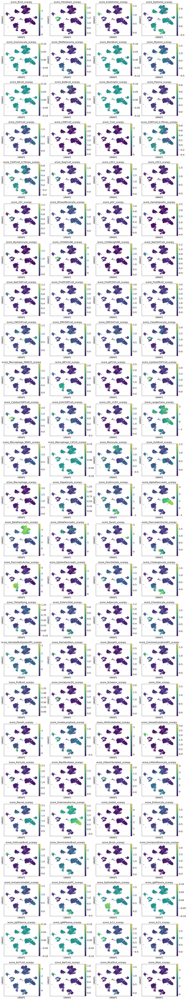

In [129]:
scores = [x for x in adata.obs.columns if 'scanpy' in x]
sc.pl.umap(adata, color= scores, color_map = 'viridis')

# Signature-based annotation

A decision-tree-based annotation that reads signatures from a provided .gmt file and hierarchy as well as cutoffs and signature ordering from a configuration file and attributes each cell to a specific type according to signature enrichment. 

This is an aid to start ther annotation and annotation can then be further refined by adding further signatures or adjusting the configuration files. It was tested mainly on PBMCs and oncology (tumor biopsies) related samples.


In [6]:
 ## PROVIDED WITH BESCA, make a local copy if you'd like to modify/add your own
gmt_file_anno= bescapath + '/besca/datasets/genesets/CellNames_scseqCMs6_sigs.gmt'
#gmt_file_anno= root_path + '/analyzed/'+analysis_name+ 'CellNames_scseqCMs6_sigs.gmt'

mymarkers = bc.tl.sig.read_GMT_sign(gmt_file_anno,directed=False)
mymarkers = bc.tl.sig.filter_siggenes(adata, mymarkers) ### remove genes not present in dataset or empty signatures
mymarkers['Ubi'] = ['B2M','ACTB', 'GAPDH'] ### used for cutoff adjustment to individual dataset, can be modified

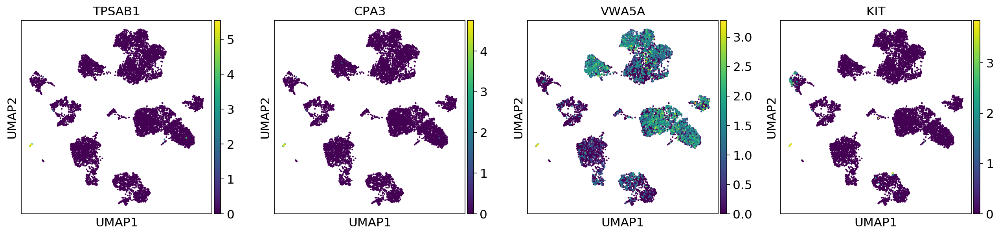

In [7]:
sc.pl.umap(adata, color= mymarkers['Mast'])
#sc.pl.umap(adata,color=['COLEC11','DCN'])

We read the configuration file, containing hierarchy, cutoff and signature priority information. 
A new version of this file should be created and maintained with each annotation. 
The included example is optimised for the annotation of the 6.6k PBMC dataset. 

In [8]:
configfile= bescapath + '/besca/datasets/genesets/CellNames_scseqCMs6_config.tsv'
#configfile=root_path + '/analyzed/'+analysis_name+'/CellNames_scseqCMs6_config.tsv' ### replace this with your config

In [9]:
sigconfig,levsk=bc.tl.sig.read_annotconfig(configfile)

Fract_pos was exported by BESCA in the standard worflow test, 
contains information of fraction positive cells per genes per cluster.

We use these values as a basis for a wilcoxon test per signature per cluster. 

In [10]:

f=pd.read_csv(results_folder + "/labelings/"+clusters+"/fract_pos.gct",sep="\t",skiprows=2)
df=bc.tl.sig.score_mw(f,mymarkers)
myc=np.median(df.loc['Ubi',:])/2 ### Set a cutoff based on Ubi and scale with values from config file


For each signature, positive and negative clusters are determined. Only positive clusters are maintained. Cutoffs can be individualised based on the config file (scaling factor) and myc, which is determined based on ubiquitously expressed genes. 

Cutoffs and orders can also be modified internally, e.g. 

In [11]:
#### Lower epithelial cutoff and ajust order 
sigconfig.loc["Epithelial","Cutoff"]=0.3
sigconfig.loc["Enteroendocrine","Cutoff"]=0.75
sigconfig.loc["Myeloid","Cutoff"]=0.05

levsk[0]=['Fibroblast','Endothelial','Hematopoetic','Epithelial','Glial','Schwann']



In [12]:
#Cluster attribution based on cutoff
df=df.drop('Ubi')
sigscores={}
for mysig in list(df.index):
    sigscores[mysig]=bc.tl.sig.getset(df,mysig,sigconfig.loc[mysig,'Cutoff']*myc)
    #sigscores[mysig]=bc.tl.sig.getset(df,mysig,10)

One can inspect the cluster attribution per cell type in the signature list and adjust cutoffs as required. 

In [13]:
sigscores

{'Fibroblast': {'11', '16'},
 'Endothelial': {'13'},
 'Epithelial': {'0',
  '1',
  '10',
  '12',
  '14',
  '15',
  '17',
  '19',
  '2',
  '21',
  '3',
  '4',
  '5',
  '6',
  '7',
  '8',
  '9'},
 'MelMelanoma': set(),
 'Myeloid': {'10', '14', '17', '18', '19', '20', '21'},
 'Plasma': set(),
 'CD4Tcell': {'11', '18', '19', '21'},
 'CD8Tcell_IL7Rmax': set(),
 'CD4Tcell_IL7Rmax': set(),
 'RegTcell': set(),
 'cDC': set(),
 'NClassMonocyte': set(),
 'pDC': set(),
 'Hematopoetic': {'18', '19'},
 'Blymphocyte': set(),
 'CD56brightNK': set(),
 'NaiCD4Tcell': set(),
 'NaiCD8Tcell': set(),
 'ProlifCD8Tcell': set(),
 'ProlifCD4Tcell': set(),
 'ProlifBcell': set(),
 'CMCD4Tcell': set(),
 'EMCD8Tcell': set(),
 'EMCD4Tcell': set(),
 'ClassMonocyte': set(),
 'Macrophage_MARCO': set(),
 'NKTcell': set(),
 'CytotoxCD4Tcell': set(),
 'CytotoxCD8Tcell': set(),
 'ExhCD8Tcell': set(),
 'cDC_CCR7': set(),
 'Langerhans': {'0', '14', '2', '21', '3', '4', '5', '6', '7', '9'},
 'Macrophage_MSR1': {'18'},
 'Monoc

Now each cluster gets annotated, according to the distinct levels specified in the config file. 
Note that in case a cluster is positive for multiple identities, only the first one is taken, 
in the order specified in the "Order" column in the config file. 

To check the given order, per levels, you can inspect levsk

In [14]:
levsk


[['Fibroblast',
  'Endothelial',
  'Hematopoetic',
  'Epithelial',
  'Glial',
  'Schwann'],
 ['Pericyte',
  'Blymphocyte',
  'Tcell',
  'CommonLymphoidPC',
  'Myeloid',
  'NKcell',
  'Enteroendocrine',
  'PancreaticAcinar',
  'ImmatureEnterocyte',
  'ImmatureGoblet',
  'EnterocytePC',
  'McellGut',
  'PancreaticDuctal',
  'PancStellate',
  'Cholangiocyte',
  'TAmplifying',
  'EntericGlial',
  'Enterocyte',
  'Goblet',
  'Paneth',
  'Brush',
  'HematoMultipotentPC',
  'InnateLymphoid',
  'HEVEndothelial',
  'VesselEndothelial',
  'Myofibroblast',
  'InflamFibroblast'],
 ['Bcell',
  'ProBcell',
  'CD8Tcell',
  'CD4Tcell',
  'Granulocyte',
  'cDC',
  'ClassMonocyte',
  'pDC',
  'Plasma',
  'CD56dimNK',
  'CD56brightNK',
  'Macrophage',
  'gdTcell',
  'NClassMonocyte',
  'NKTcell',
  'Mast',
  'PPcell',
  'BetaPancreatic',
  'AlphaPancreatic',
  'DeltaPancreatic',
  'EpsilonPancreatic',
  'Basophil',
  'Monocyte',
  'ILC1',
  'ILC3',
  'ActTcell',
  'NaiTcell'],
 ['MemBcell',
  'NaiBcell',

In [15]:
### One can choose to exclude certain cell types not relevant for the analysed sample 
### or which go too much into detail for the current resolution
toexclude=['Cholangiocyte','Hepatocyte', 'Macrophage_MARCO','Macrophage_MSR1']

In [16]:
cnames=bc.tl.sig.make_anno(df,sigscores,sigconfig,levsk,'celltype',toexclude)

We now obtained per each cluster cell type attribution at distinct levels. 

In [17]:
cnames

,celltype0,celltype1,celltype2,celltype3
13,Endothelial,VesselEndothelial,VesselEndothelial,VesselEndothelial
9,Epithelial,Enteroendocrine,BetaPancreatic,BetaPancreatic
20,Glial,Glial,Glial,Glial
1,Epithelial,PancreaticAcinar,PancreaticAcinar,PancreaticAcinar
5,Epithelial,Enteroendocrine,DeltaPancreatic,DeltaPancreatic
0,Epithelial,Enteroendocrine,AlphaPancreatic,AlphaPancreatic
6,Epithelial,Enteroendocrine,AlphaPancreatic,AlphaPancreatic
8,Epithelial,PancreaticDuctal,PancreaticDuctal,PancreaticDuctal
14,Epithelial,Enteroendocrine,BetaPancreatic,BetaPancreatic
7,Epithelial,Enteroendocrine,BetaPancreatic,BetaPancreatic


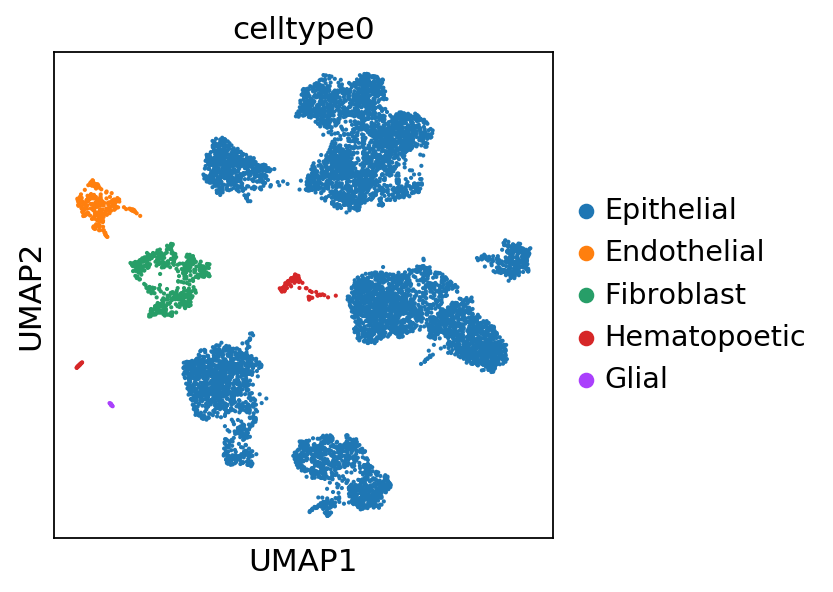

In [18]:
adata.obs['celltype0']=bc.tl.sig.add_anno(adata,cnames,'celltype0',clusters)
adata.obs['celltype1']=bc.tl.sig.add_anno(adata,cnames,'celltype1',clusters)
adata.obs['celltype2']=bc.tl.sig.add_anno(adata,cnames,'celltype2',clusters)
adata.obs['celltype3']=bc.tl.sig.add_anno(adata,cnames,'celltype3',clusters)

sc.pl.umap(adata,color=['celltype0']) #,'celltype3'

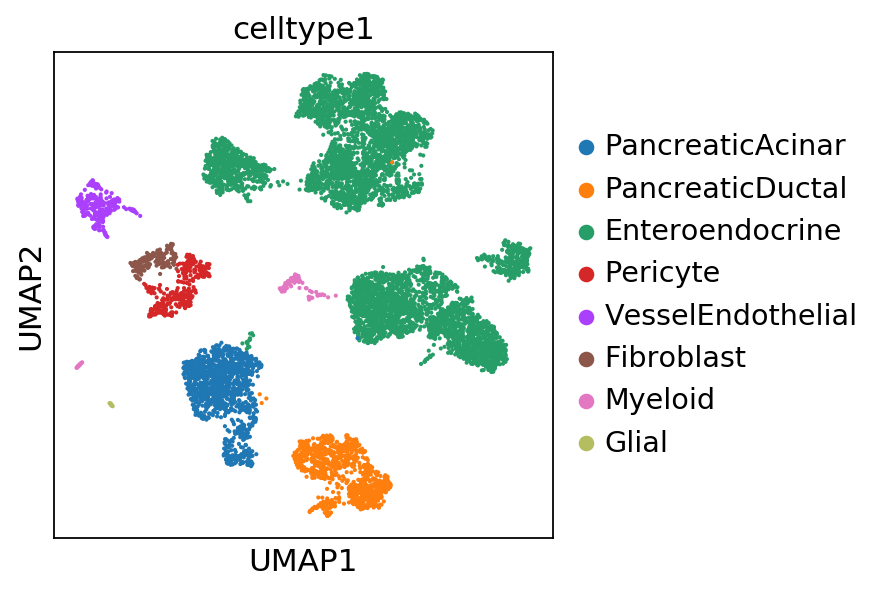

In [19]:
sc.pl.umap(adata,color=['celltype1']) #,'celltype3'

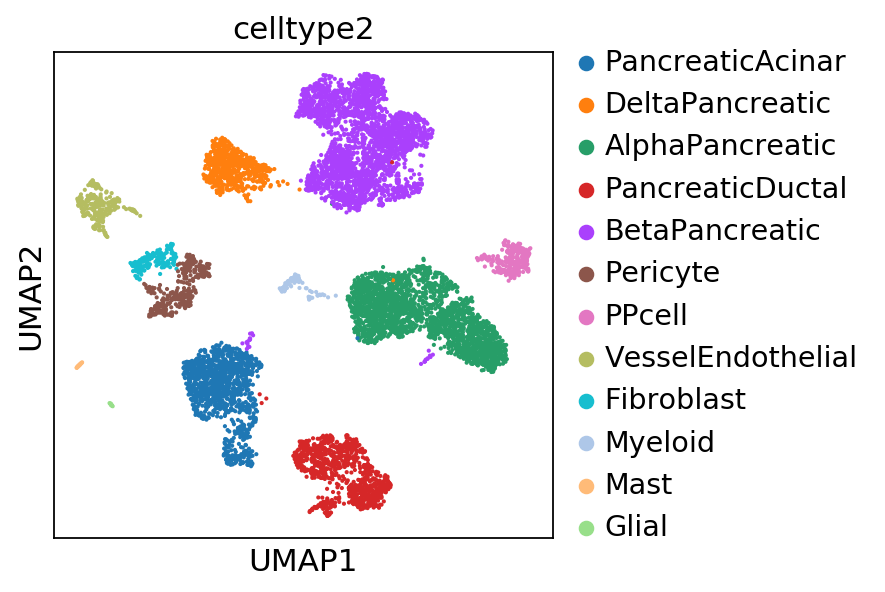

In [20]:
sc.pl.umap(adata,color=['celltype2']) #,'celltype3'

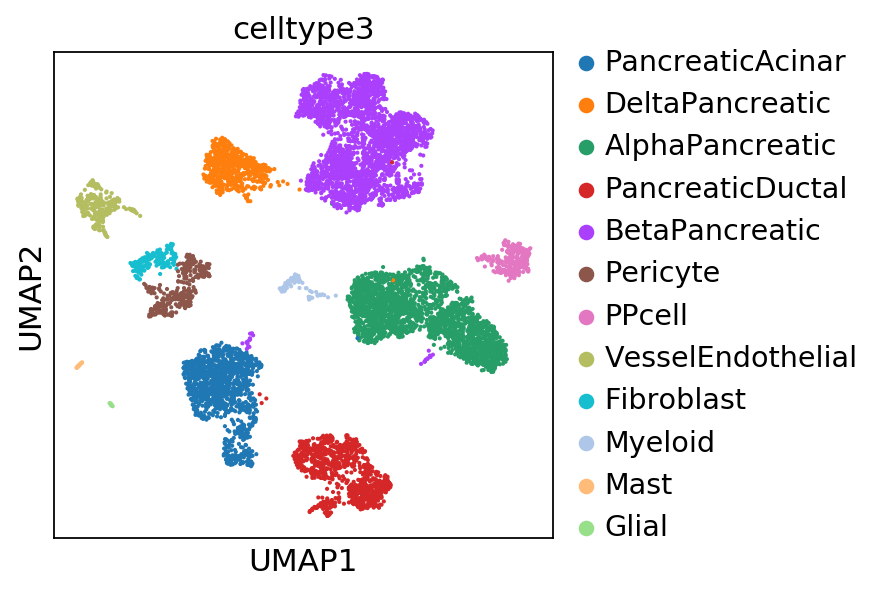

In [21]:
sc.pl.umap(adata,color=['celltype3']) #,'celltype3'

Only short names were used in the signature naming convention in this case. 
One can easity tranform this to EFO terms if preferred, a conversion table comes with besca. 

In [22]:
### transform these short forms to dblabel - EFO standard nomenclature
nomenclature=pd.read_csv(bescapath+'/besca/datasets/nomenclature/CellTypes_v1.tsv',sep='\t',header=0,skiprows=range(1, 2))


In [24]:
cnamesDBlabel=[]
for mycol in list(cnames.columns):
    cnamesDBlabel.append([list(nomenclature.loc[nomenclature['short_dblabel']==x,'dblabel'])[0] for x in list(cnames[mycol])])
cnamesDBlabel=pd.DataFrame(cnamesDBlabel).transpose()
cnamesDBlabel.columns=cnames.columns
cnamesDBlabel.index=cnames.index

In [25]:
cnamesDBlabel

,celltype0,celltype1,celltype2,celltype3
13,endothelial cell,blood vessel endothelial cell,blood vessel endothelial cell,blood vessel endothelial cell
9,epithelial cell,enteroendocrine cell,type B pancreatic cell,type B pancreatic cell
20,glial cell,glial cell,glial cell,glial cell
1,epithelial cell,pancreatic acinar cell,pancreatic acinar cell,pancreatic acinar cell
5,epithelial cell,enteroendocrine cell,pancreatic D cell,pancreatic D cell
0,epithelial cell,enteroendocrine cell,pancreatic A cell,pancreatic A cell
6,epithelial cell,enteroendocrine cell,pancreatic A cell,pancreatic A cell
8,epithelial cell,pancreatic ductal cell,pancreatic ductal cell,pancreatic ductal cell
14,epithelial cell,enteroendocrine cell,type B pancreatic cell,type B pancreatic cell
7,epithelial cell,enteroendocrine cell,type B pancreatic cell,type B pancreatic cell


Finally, one can add the new labels to adata.obs as annotation. 

In [26]:
adata.obs['celltype0']=bc.tl.sig.add_anno(adata,cnamesDBlabel,'celltype0',clusters)
adata.obs['celltype1']=bc.tl.sig.add_anno(adata,cnamesDBlabel,'celltype1',clusters)
adata.obs['celltype2']=bc.tl.sig.add_anno(adata,cnamesDBlabel,'celltype2',clusters)
adata.obs['celltype3']=bc.tl.sig.add_anno(adata,cnamesDBlabel,'celltype3',clusters)

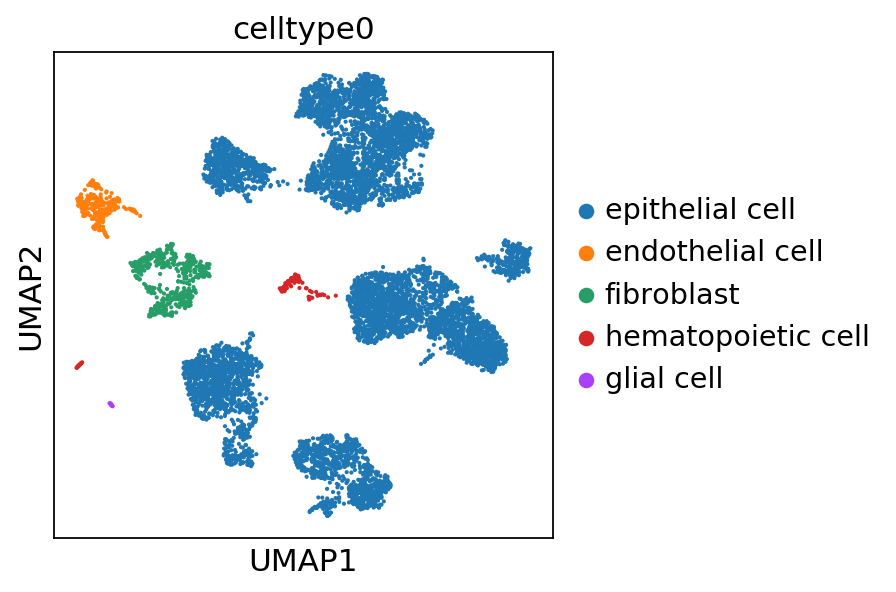

In [27]:
sc.pl.umap(adata,color=['celltype0']) #,'celltype3'

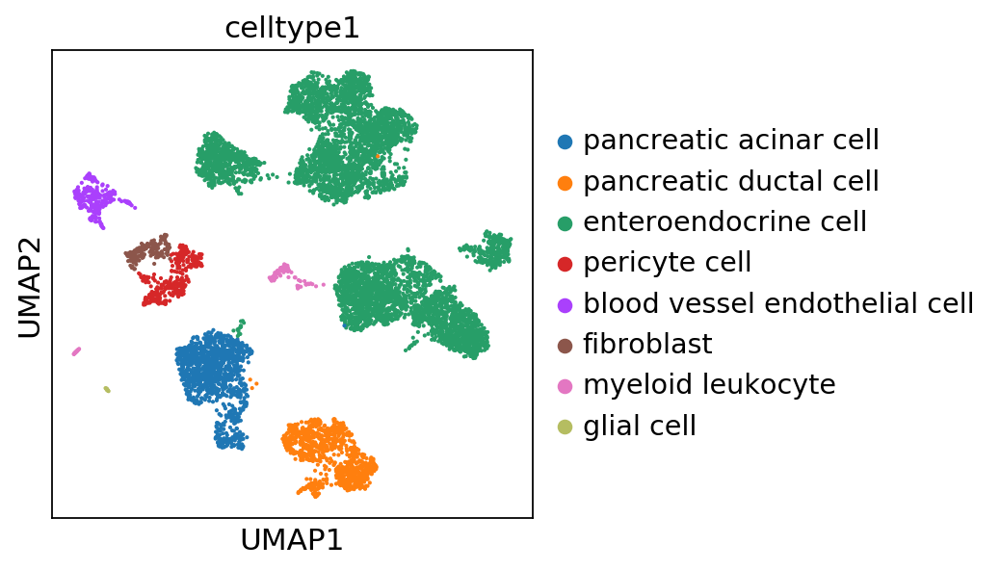

In [28]:
sc.pl.umap(adata,color=['celltype1']) #,'celltype3'

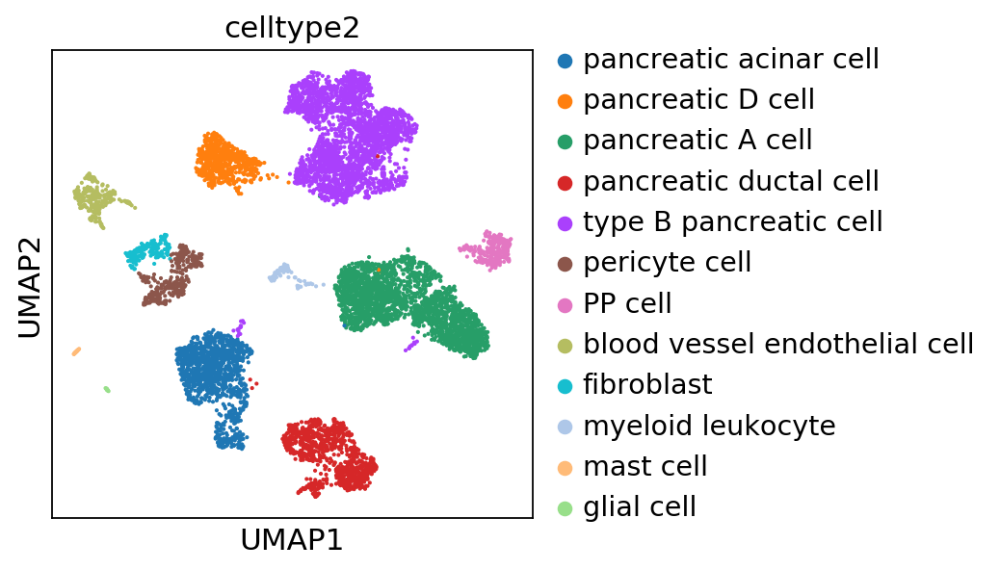

In [29]:
sc.pl.umap(adata,color=['celltype2']) #,'celltype3'

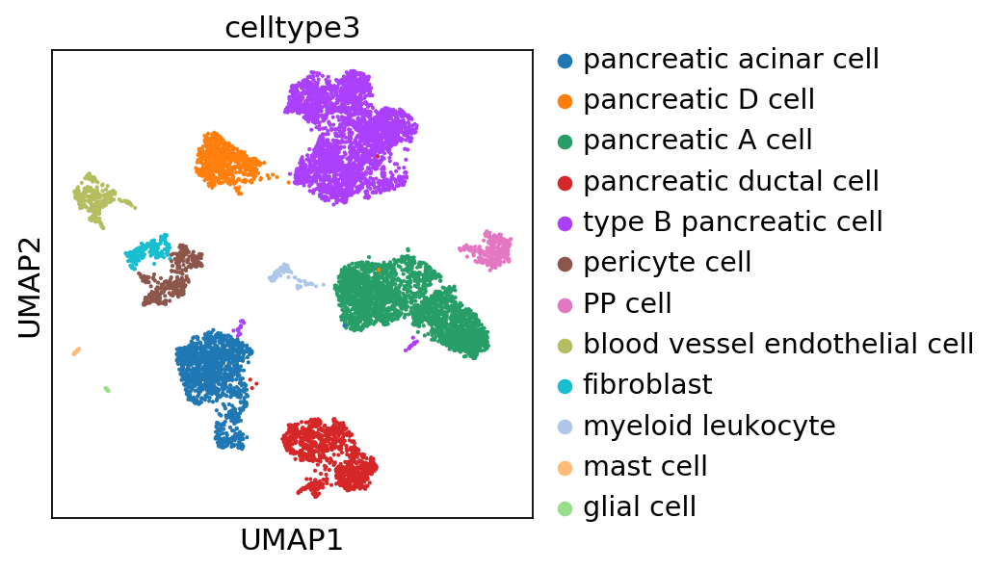

In [30]:
sc.pl.umap(adata,color=['celltype3']) #,'celltype3'

In [31]:
adata.obs['dblabel']=adata.obs['celltype3']

In [32]:
### Save file in case happy with annotation
adata.write(results_file)

### Export labelling

Chosen labels can also be exported as a new folder in labelings/

In [33]:
### Save labelling
adata = bc.st.additional_labeling(adata, 'celltype3', 'celltype3', 'Major cell types attributed based on HumanCD45p_scseqCMs8', 'schwalip', results_folder)


rank genes per label calculated using method wilcoxon.
mapping of cells to  celltype3 exported successfully to cell2labels.tsv
average.gct exported successfully to file
fract_pos.gct exported successfully to file
labelinfo.tsv successfully written out
.//analyzed/standard_workflow_besca2_0/labelings/celltype3/WilxRank.gct written out
.//analyzed/standard_workflow_besca2_0/labelings/celltype3/WilxRank.pvalues.gct written out
.//analyzed/standard_workflow_besca2_0/labelings/celltype3/WilxRank.logFC.gct written out


In [34]:
### Save labelling
adata = bc.st.additional_labeling(adata, 'dblabel', 'dblabel', 'Cell types attributed according to EFO nomenclature', 'schwalip', results_folder)


rank genes per label calculated using method wilcoxon.
mapping of cells to  dblabel exported successfully to cell2labels.tsv
average.gct exported successfully to file
fract_pos.gct exported successfully to file
labelinfo.tsv successfully written out
.//analyzed/standard_workflow_besca2_0/labelings/dblabel/WilxRank.gct written out
.//analyzed/standard_workflow_besca2_0/labelings/dblabel/WilxRank.pvalues.gct written out
.//analyzed/standard_workflow_besca2_0/labelings/dblabel/WilxRank.logFC.gct written out


### Explore marker genes

In [35]:

### Perform DE cells of each celltype3 vs. all other cells
DEgenes=bc.tl.dge.get_de(adata,'celltype3',demethod='wilcoxon',topnr=5000, logfc=1,padj=0.05)

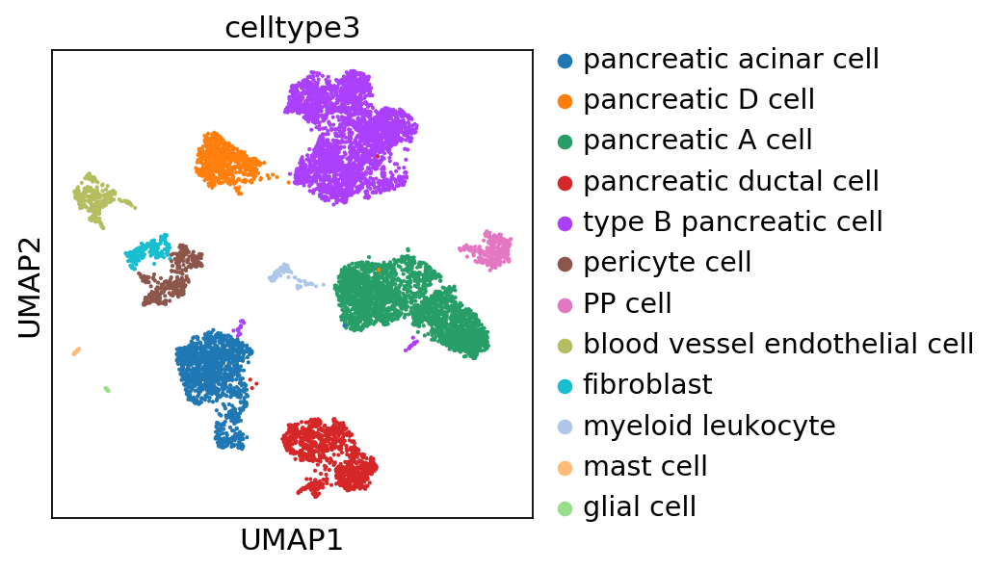

In [36]:
sc.pl.umap(adata, color= ['celltype3'])

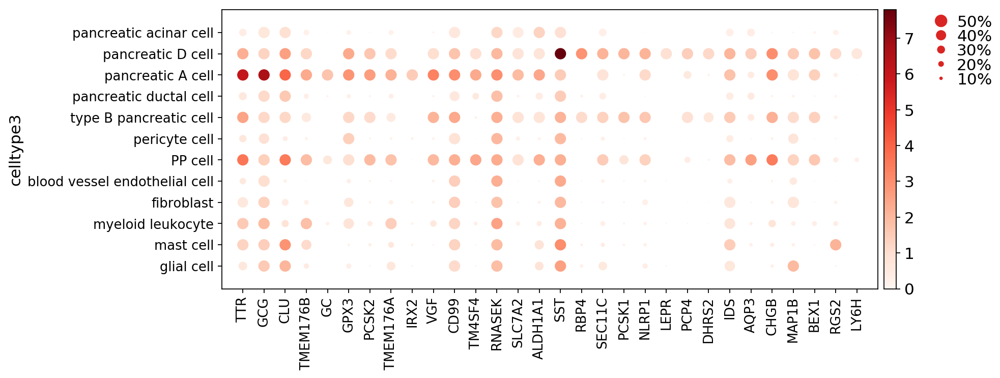

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.5, 0, 0.2, 0.5, 0.25])

In [37]:
### Select only top 15 genes (in order of p-val) for 2 cell types and plot expression per cell type
tops=list(DEgenes['pancreatic A cell']['Name'][0:15])+list(DEgenes['pancreatic D cell']['Name'][0:15])
sc.pl.dotplot(adata, var_names=tops,groupby='celltype3', dot_max=0.5)

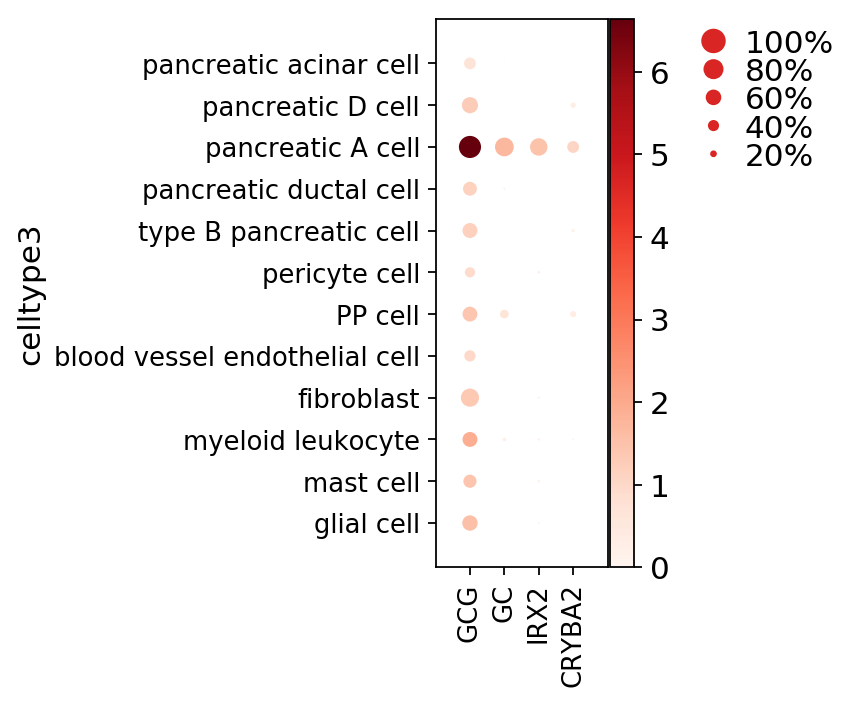

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [38]:

sc.pl.dotplot(adata, var_names=mymarkers['AlphaPancreatic'],groupby='celltype3')
